# High-dynamic range imaging

# Info
CS 484 Final Project: High-dynamic range imaging <br>
Group Size: 1 (individual project) <br>
Student Name: Jingtong Hu (J278HU) <br>
Student id: 20755586 


# Abstract
When a photograph is taken by a camera, only a very limited range of radiance values can be captured, so it's common for a photo to be overexposed or underexposed. In the areas that are too bright or too dark, the information is lost, since the range of radiance values is very limited. 

Here we implement the Debevec-Malik method in order to solve this problem. This method is introduced in the paper "Recovering High Dynamic Range Radiance Maps from Photographs"[2]. The main idea is taking several photos with different exposure, recover the Camera Response Function(CRF), and with the CRF, we can merge the photos with different exposures together to form a radiance map, where the pixel values are proportional to the real radiance of the scene where these photo are taken. Then the final objective is getting one image that preserves all the details of the brightest and darkest parts in the input images.

# Libraries

In [1]:
# commonly used libraries
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy.linalg as la
from random import sample

# PIL: for image data extraction and image enhancement
from PIL import ImageEnhance
from PIL import Image
from PIL.ExifTags import TAGS

# CV2: only for demostration purpose, not included in implementation
import cv2


# Part I: get familiar with the steps using cv2 library

## Step I: Read Images

In [2]:
def readImgAndTime(name, imgFormat, convertToCV2) :
    """Reads the set of 3 images in dir images by the name

    Args:
    name (str): the name of the set of images
    imgFormat (str): the format of the set of images
    convertToCV2 (bool): whether convert the returning image to cv2 format

    Returns:
    images: an array of images
    times: an array of exposure times
    """
    name_under = "images/" + name + "-2EV" + imgFormat
    name_normal = "images/" + name + "+0EV" + imgFormat
    name_over = "images/" + name + "+2EV" + imgFormat
    
    im_under = Image.open(name_under)
    im_normal = Image.open(name_normal)
    im_over = Image.open(name_over)
    
    images = [im_under, im_normal, im_over]
    times = []
    for img in images:
        exifdata = img.getexif()
        
        for tag_id in exifdata:
            # get the tag name, instead of human unreadable tag id
            tag = TAGS.get(tag_id, tag_id)
            data = exifdata.get(tag_id)
            
            # get the exposure time
            if tag == "ExposureTime" :
                # decode bytes 
                if isinstance(data, bytes):
                    data = data.decode()
                times += [data]
                break
    
    if convertToCV2 :
        # convert to cv2 format
        im_under = cv2.imread(name_under)
        im_normal = cv2.imread(name_normal)
        im_over = cv2.imread(name_over)
        images = np.array([im_under, im_normal, im_over])
    times = np.array(times, dtype=np.float32)
                
    return images, times
    
    

In [3]:
def showImages(images, times):
    fig = plt.figure(figsize = (30, 10))
    plt.subplot(131)
    plt.title("Under Exposed Image - exposure time: " + str(round(times[0], 4)))
    plt.imshow(images[0])
    plt.subplot(132)
    plt.title("Camera Auto Exposed Image - exposure time: " + str(round(times[1], 4)))
    plt.imshow(images[1])
    plt.subplot(133)
    plt.title("Over Exposed Image - exposure time: " + str(round(times[2], 4)))
    plt.imshow(images[2])
    plt.show()

In [4]:
def showCVImages(CVimages, times):
    cv2.imwrite('images/tmp0.jpeg', CVimages[0])
    cv2.imwrite('images/tmp1.jpeg', CVimages[1])
    cv2.imwrite('images/tmp2.jpeg', CVimages[2])
    
    im0 = Image.open('images/tmp0.jpeg')
    im1 = Image.open('images/tmp1.jpeg')
    im2 = Image.open('images/tmp2.jpeg')
    PILimages = [im0, im1, im2]
    
    showImages(PILimages, times)
    

In [5]:
def showCVImage(CVimage):
    cv2.imwrite('images/tmp0.jpeg', CVimage)

    im0 = Image.open('images/tmp0.jpeg')
    
    plt.imshow(im0)
    plt.show()

#### Set of images comes from easyHDR [1].

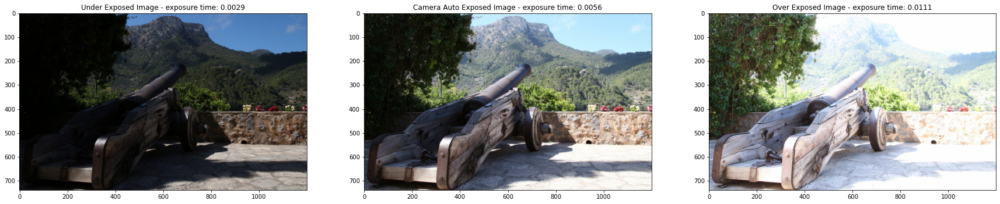

In [6]:
# read the images and times in the cv2 format
cvImages, times = readImgAndTime("cannon", ".jpeg", True)
showCVImages(cvImages, times)

## Step II: Aline with MTB

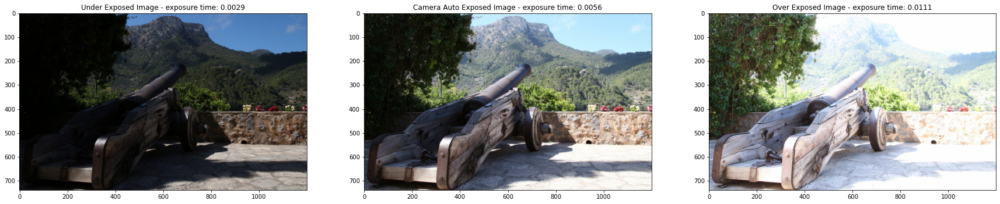

In [7]:
# Align input images
alignMTB = cv2.createAlignMTB()
alignMTB.process(cvImages, cvImages)

showCVImages(cvImages, times)

# Step III: Recover Camera Response Function (CRF)

In [8]:
def displayCRF(resonseCurve) :
    # show the Camera Response Function in RGB channel
    plt.figure(figsize=(5,5))
    gr = resonseCurve[:,:,0]
    gg = resonseCurve[:,:,1]
    gb = resonseCurve[:,:,2]
    plt.title("Inverse Response Curve for RGB channels")
    plt.xlabel("Pixel Values(Z)")
    plt.ylabel("Log Exposure")
    rline = plt.plot(gr, range(256), 'r', label='red')
    plt.plot(gg, range(256), 'g', label='green')
    plt.plot(gb, range(256), 'b', label='blue')
    plt.legend()
    plt.show()

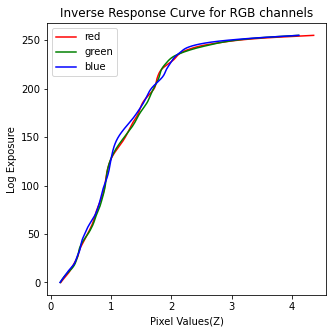

In [9]:
# Obtain Camera Response Function (CRF) using cv2
responseDebevecCV = cv2.createCalibrateDebevec().process(cvImages, times)
displayCRF(responseDebevecCV)

## Step IV: Merge the images using CRF

max pixel value: 885.31323
min pixel value: 18.790178


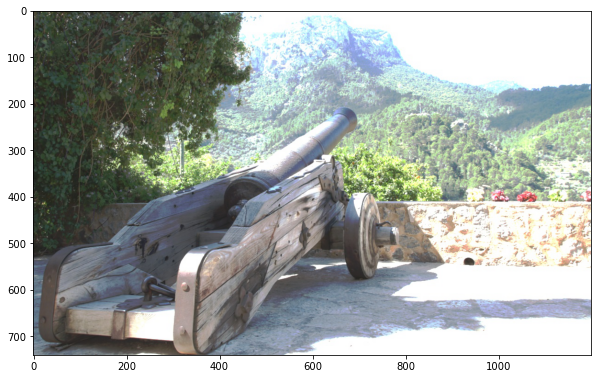

In [10]:
# Merge images into an HDR linear image
hdrDebevecCV = cv2.createMergeDebevec().process(cvImages, times, responseDebevecCV)
fig = plt.figure(figsize = (10, 10))
print("max pixel value: " + str(np.max(hdrDebevecCV)))
print("min pixel value: " + str(np.min(hdrDebevecCV)))

showCVImage(hdrDebevecCV)

### The image above covers a wide range of radiance values, we need to fit it into [0, 255] with Tone mapping.

## Step V: Tone mapping

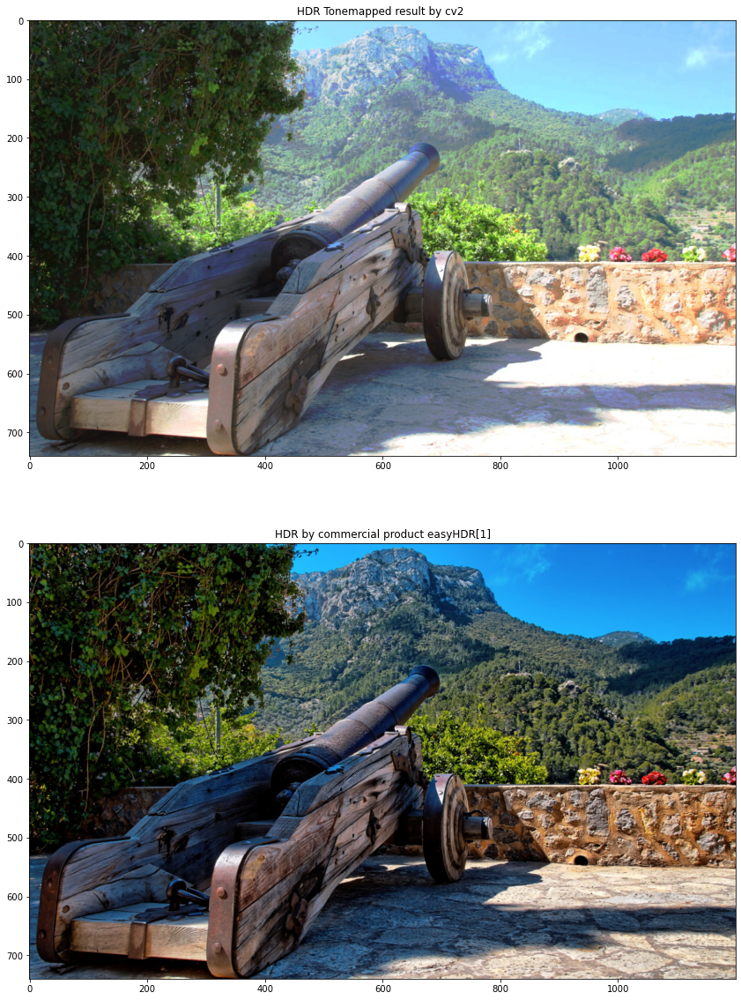

In [11]:
# Tone mapping using Drago's method 
tonemapDrago = cv2.createTonemapDrago(0.7, 1)
ldrDragoCV = tonemapDrago.process(hdrDebevecCV)
ldrDragoCV = 3 * ldrDragoCV
cv2.imwrite('images/hdr.jpeg',ldrDragoCV * 255)
ldrDragoCV = Image.open('images/hdr.jpeg')
hdr = Image.open('images/cannon-hdr.jpeg')

fig = plt.figure(figsize = (20, 20))
plt.subplot(212)
plt.title("HDR by commercial product easyHDR[1]")
plt.imshow(hdr)
plt.subplot(211)
plt.title("HDR Tonemapped result by cv2 ")
plt.imshow(ldrDragoCV)
plt.show()

### The Part I example of HDR image generated by cv2 library is good enough for demonstration, although the details at the rigth bottom bright area are not clear. 

### Then let's try to implement the algorithm in Part II by ourselves.

# Part II: Implement Debevec-Malik method

### Now we can start to implement Debevec-Malik method with similar steps in Part I

## Step I: Read the Images

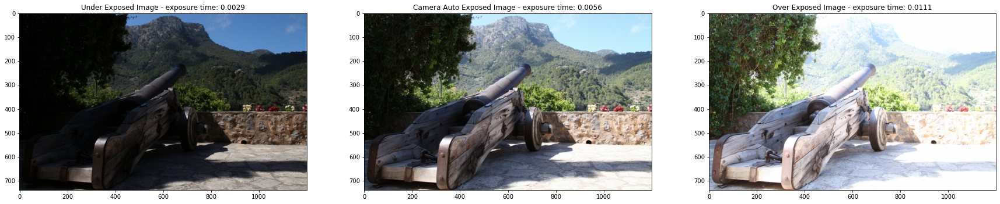

In [12]:
# read the images and times in the PIL format
images, times = readImgAndTime("cannon", ".jpeg", False)
showImages(images, times)

## Step II: Implement the gsolve algorithm

### This gsolve algorithm solves the least square equation
$$ E = \sum_i \sum_j w(Z_{ij})[g[z_{i, j}] - \log(E_i) - \log t_j]^2 + \lambda \sum_k w(k) g''(k)^2 $$

### This algorithm is already implemented in Matlab code, included in the paper[2], we will implement it again using python here.

<code>Matlab
%
% gsolve.m − Solve for imaging system response function
%
% Given a set of pixel values observed for several pixels in several
% images with different exposure times, this function returns the
% imaging system’s response function g as well as the log film irradiance
% values for the observed pixels.
%
% Assumes:
%
% Zmin = 0
% Zmax = 255
%
% Arguments:
%
% Z(i,j) is the pixel values of pixel location number i in image j
% B(j) is the log delta t, or log shutter speed, for image j
% l is lamdba, the constant that determines the amount of smoothness
% w(z) is the weighting function value for pixel value z
%
% Returns:
%
% g(z) is the log exposure corresponding to pixel value z
% lE(i) is the log film irradiance at pixel location i
%
function [g,lE]=gsolve(Z,B,l,w)

n = 256;

A = zeros(size(Z,1)*size(Z,2)+n+1,n+size(Z,1));
b = zeros(size(A,1),1);

%% Include the data−fitting equations

k = 1;
for i=1:size(Z,1)
  for j=1:size(Z,2)
    wij = w(Z(i,j)+1);
    A(k,Z(i,j)+1) = wij; A(k,n+i) = −wij; b(k,1) = wij * B(i,j);
    k=k+1;
  end
end

%% Fix the curve by setting its middle value to 0

A(k,129) = 1;
k=k+1;

%% Include the smoothness equations

for i=1:n−2
  A(k,i)=l*w(i+1); A(k,i+1)=−2*l*w(i+1); A(k,i+2)=l*w(i+1);
  k=k+1;
end

%% Solve the system using SVD

x = A\b;

g = x(1:n);
lE = x(n+1:size(x,1));
</code>

### weighting function w mapped each values of Z (from 0 to 255) to a weight that decays to zero at both ends

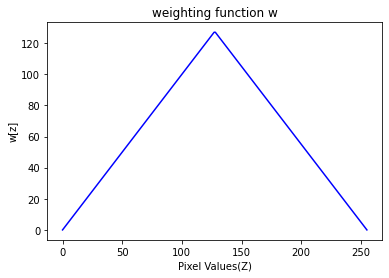

In [13]:
# w(z) is the weighting function value for pixel value z
Zmin = 0
Zmax = 255
w = np.zeros(256)
for z in range(256):
    if z <= 1/2 * (Zmin + Zmax) :
        w[z] = z - Zmin
    else :
        w[z] = Zmax - z    

fig = plt.figure()
plt.plot(range(256), w, 'b')
plt.title("weighting function w")
plt.xlabel("Pixel Values(Z)")
plt.ylabel("w[z]")
plt.show()

### Implement function that generate the parameters: Z, B and w for gsolve

In [14]:
def gsolveParams(images, times, sampleIndices = None) : 
    
    # Z(i,j) is the pixel values of pixel location number i in image j
    nofImages = len(images)
    
    if sampleIndices is None :
        width, height = images[0].size
        Z = np.zeros((nofImages, width * height));
        for i in range(nofImages) :
            Z[i] = np.array(list(images[i].getdata()))
    else :
        Z = np.zeros((nofImages, sampleSize));
        for i in range(nofImages) :
            Z[i] = np.array(list(images[i].getdata()))[sampleIndices]
    
    #print(Z)
    # B(j) is the log delta t, or log shutter speed, for image j
    B = []
    for time in times :
        B += [np.log(time)]
        
    # w(z) is the weighting function value for pixel value z
    Zmin = 0
    Zmax = 255
    w = np.zeros(256)
    for z in range(256):
        if z <= 1/2 * (Zmin + Zmax) :
            w[z] = z - Zmin
        else :
            w[z] = Zmax - z    
    
    return Z, B, w

### Implement gsolve

In [15]:
# Obtain Camera Response Function (CRF) using our own implementation of the Debevec Malik's method 
# on the paper "Reconvering High Dynamic Range Radiance Maps from Photographs" 
def gsolve(Z,B,l,w):
    """
    Assumes:

    Zmin = 0
    Zmax = 255

    Arguments:

    Z(i,j): the pixel values of pixel location number i in image j
    B(j): the log delta t, or log shutter speed, for image j
    l: lamdba, the constant that determines the amount of smoothness
    w(z): the weighting function value for pixel value z

    Returns:

    g(z): the log exposure corresponding to pixel value z
    lE(i): the log film irradiance at pixel location i
    """
    n = 256
    Z0 = np.shape(Z)[0] # j
    Z1 = np.shape(Z)[1] # i
    #print(Z0)
    #print(Z1)
    A = np.zeros(shape = (Z0 * Z1 + n + 1, n + Z1), dtype = np.float32)
    b = np.zeros(shape = (np.shape(A)[0], 1), dtype = np.float32)
    #print(np.array(A).shape)
    # Include the data−fitting equations
    k = 0
    for i in range(np.size(Z, 1)):
        for j in range(np.size(Z, 0)):
            z = int(Z[j][i])
            wij = w[z]
            A[k][z] = wij
            A[k][n+i] = -wij
            b[k] = wij*B[j]
            k += 1
    # Fix the curve by setting its middle value to 0

    A[k][128] = 1;
    k += 1

    # Include the smoothness equations
    for i in range(n - 2) :
        A[k][i] = l * w[i + 1]
        A[k][i + 1] = -2 * l * w[i + 1]
        A[k][i + 2] = l * w[i + 1]
        k += 1
    # Solve the system using SVD

    x = np.dot(la.pinv(A), b)

    g = x[:n]
    lE = x[n:]
    
    return g, lE
    

### Wrap gsolve with the recoverCRF function

In [16]:
def recoverCRF(images, times, sampleIndices , l = 10) :
    """
    Arguments:
    
    images: an array of images
    times: an array of exposure times
    sampleIndices: indices of the sampled pixels
    l (float): lamdba, the constant that determines the amount of smoothness
    
    Returns:

    g(z): the log exposure corresponding to pixel value z
    lE(i): the log film irradiance at pixel location i
    """
    Z, B, w = gsolveParams(images, times, sampleIndices)
        
    g, lE = gsolve(Z,B,l,w)
    return g, lE
    

## Step III: Recover the Camera Response Function (CRF) 

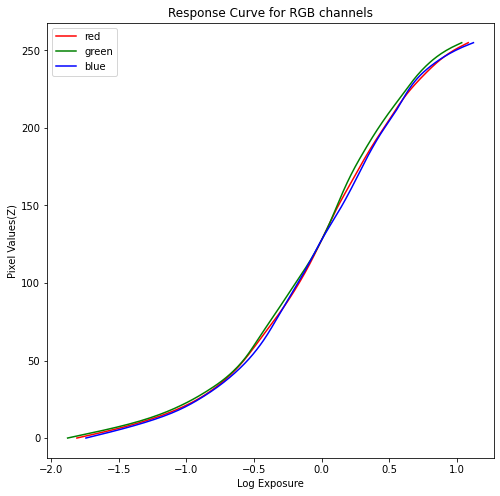

In [17]:
# Recover Camera Response Function (CRF) 
imagesR = []
imagesG = []
imagesB = []
for i in range(len(images)) :
    r, g, b = images[i].split()
    imagesR += [r]
    imagesG += [g]
    imagesB += [b]
width, height = images[0].size
sampleSize = 1000
sampleIndices = np.arange(sampleSize) * int(width * height / sampleSize)
gR, lER = recoverCRF(imagesR, times, sampleIndices, l = 100)
gG, lEG = recoverCRF(imagesG, times, sampleIndices, l = 100)
gB, lEB = recoverCRF(imagesB, times, sampleIndices, l = 100)

#displayCRF(responseDebevec)
fig = plt.figure(figsize = (8, 8))
plt.plot(gR, range(256), 'r', label = "red")
plt.plot(gG, range(256), 'g', label = "green")
plt.plot(gB, range(256), 'b', label = "blue")
plt.title("Response Curve for RGB channels")
plt.ylabel("Pixel Values(Z)")
plt.xlabel("Log Exposure")
plt.legend()
print()
plt.show()

In [18]:
def getCRFData(images, times, lE) :
    nofImages = len(images)
    
    Z, B, w = gsolveParams(images, times, sampleIndices)
        
    X = np.zeros((nofImages, sampleSize));
    for j in range(X.shape[0]): 
        for i in range(X.shape[1]): 
            X[j][i] = lE[i] + B[j]
    return Z, X

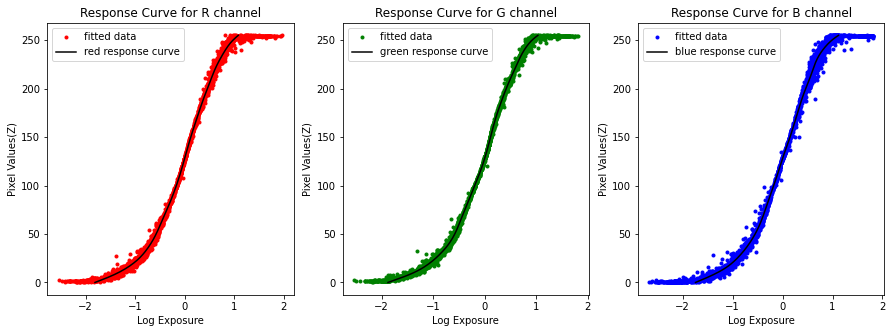

In [19]:
ZR, XR = getCRFData(imagesR, times, lER)
ZG, XG = getCRFData(imagesG, times, lEG)
ZB, XB = getCRFData(imagesB, times, lEB)

fig = plt.figure(figsize = (15, 5))
gs = gridspec.GridSpec(1, 3)
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(XR.flatten(), ZR.flatten(), 'r.', label = "fitted data")
ax1.plot(gR, range(256), 'k', label = "red response curve")
ax1.set_title("Response Curve for R channel")
ax1.set_ylabel("Pixel Values(Z)")
ax1.set_xlabel("Log Exposure")
ax1.legend()

ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(XG.flatten(), ZG.flatten(), 'g.', label = "fitted data")
ax2.plot(gG, range(256), 'k', label = "green response curve")
ax2.set_title("Response Curve for G channel")
ax2.set_ylabel("Pixel Values(Z)")
ax2.set_xlabel("Log Exposure")
ax2.legend()

ax3 = fig.add_subplot(gs[0, 2])
ax3.plot(XB.flatten(), ZB.flatten(), 'b.', label = "fitted data")
ax3.plot(gB, range(256), 'k', label = "blue response curve")
ax3.set_title("Response Curve for B channel")
ax3.set_ylabel("Pixel Values(Z)")
ax3.set_xlabel("Log Exposure")
ax3.legend()

plt.show()

## Step IV: Recover Radiance Map with CRF

### Implement the function for recovering radiance map using this equation from paper[2]:

$$ \ln E_i = \frac{\sum^P_{j=1}w(Z_{ij})(g(Z_{ij})-\ln\Delta t_j)}{\sum^P_{j=1}w(Z_{ij})}$$

In [20]:
def recoverRadianceMap(g, images, times) :
    Z, B, w = gsolveParams(images, times)
    nofImages = Z.shape[0]
    nofSamples = Z.shape[1]
    lnE = np.zeros(nofSamples)
    
    for i in range(nofSamples):
        sumNume = 0
        sumDeno = 0
        for j in range(nofImages):
            Zij = int(Z[j][i])
            #print(Zij)
            sumNume += w[Zij] * (g[Zij] - B[j])
            sumDeno += w[Zij]
        if sumDeno != 0 :
            lnE[i] = sumNume / sumDeno
        else :
            lnE[i] = sumNume
    width, height = images[0].size
    radianceMap = np.reshape(lnE, (height, width))
    return radianceMap
        

### Create the radiance map for each channel (this takes time)

In [21]:
radianceMapR = recoverRadianceMap(gR, imagesR, times)
print("Radiance map for channel R created...")
radianceMapG = recoverRadianceMap(gG, imagesG, times)
print("Radiance map for channel G created...")
radianceMapB = recoverRadianceMap(gB, imagesB, times)
print("Radiance map for channel B created...")
print("Done.")

Radiance map for channel R created...
Radiance map for channel G created...
Radiance map for channel B created...
Done.


### Show the range of the radiace map

In [22]:
radianceMap = np.dstack((radianceMapR,radianceMapG,radianceMapB))
print("max radiance value: " + str(np.max(radianceMap)))
print("min radiance value: " + str(np.min(radianceMap)))

max radiance value: 6.781793117523193
min radiance value: 0.0


### Display the radiance map

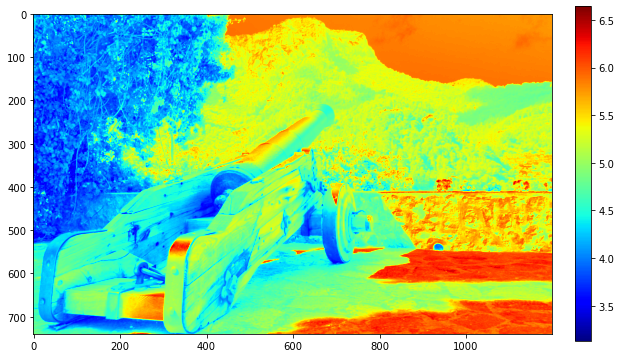

In [23]:
fig = plt.figure(figsize = (10, 10))

# convert to grayscale
rmGray = np.dot(radianceMap[...,:], [0.2126, 0.7152, 0.0722])

ax = plt.imshow(rmGray, cmap='jet')
plt.colorbar(ax, fraction=0.03, pad=0.04)
plt.show()

### Comparing the radiance map to the original set of images:
#### 1. the darkest parts are marked as blue, such as the leaves on the left and the back side of the cannon.
#### 2. the brightest parts are in red, which is the reflection of sunlight on the bottom right corner of the ground.
#### Conclusion: the radiance map reflects the real radiance of the scene.

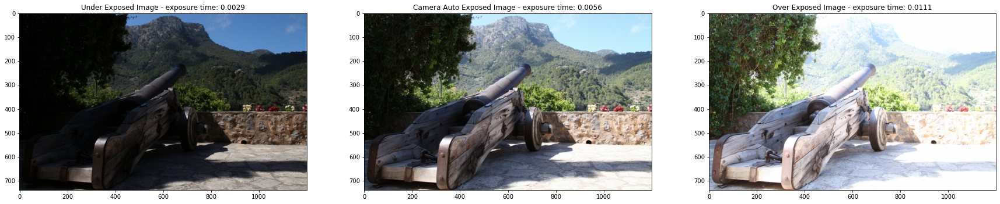

In [24]:
images, times = readImgAndTime("cannon", ".jpeg", False)
showImages(images, times)

## Step V: Tone mapping
### Compress the radiance map into a LDR image that contains the HDR details

## Naive Approach: simple linear map

### Stretch the radiance value into pixel value (linearly mapped)

max pixel value: 255.0
min pixel value: 0.0


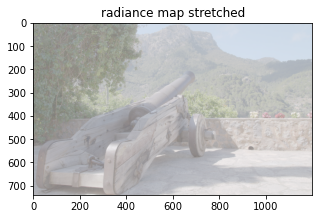

In [25]:
rmStretched = (radianceMap - np.min(radianceMap)) * (255 / (np.max(radianceMap) - np.min(radianceMap)))

# clip
rmStretched[np.where(rmStretched > 255)] = 255
rmStretched[np.where(rmStretched < 0)] = 0

print("max pixel value: " + str(np.max(rmStretched)))
print("min pixel value: " + str(np.min(rmStretched)))

rmStretchedImg = Image.fromarray(np.uint8(rmStretched))

fig = plt.figure(figsize = (5, 5))
plt.title("radiance map stretched")
plt.imshow(rmStretchedImg)
plt.show()

#### If we directly stretch the radiance map to the range of [0, 255], the image is too bright, and the contrast is low

In [26]:
print("mean value of pixel: " + str(np.mean(list(rmStretchedImg.getdata()))))

mean value of pixel: 185.22090427927927


In [27]:
def plotHist(img, title) :
    fig = plt.figure(figsize = (20, 5))
    counts, bins = np.histogram(img, bins = 120)
    plt.hist(bins[:-1], bins, weights=counts)
    plt.title(title)
    plt.xlabel("pixel value")
    plt.ylabel("pixel count")
    plt.xticks(range(0, 255, 10))
    plt.show()
    

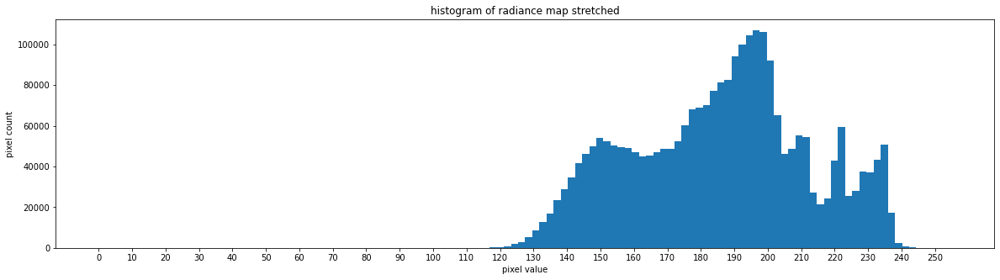

In [28]:
plotHist(rmStretched, "histogram of radiance map stretched")

### Clip and stretch again

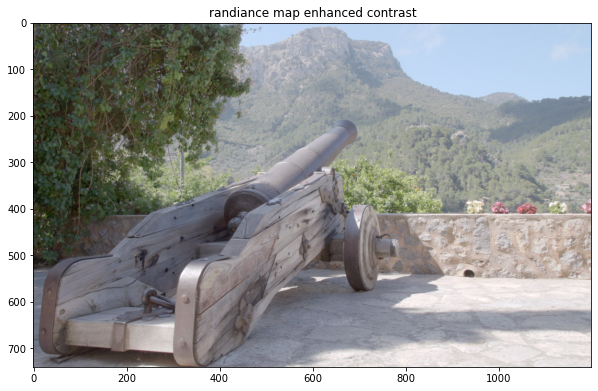

In [29]:
rmClipped = rmStretched
rmClipped[np.where(rmClipped < 120)] = 120
rmClipped[np.where(rmClipped > 240)] = 240
rmStretched2 = (rmClipped - np.min(rmClipped)) * (255 / (np.max(rmClipped) - np.min(rmClipped)))

rmStretched2Img = Image.fromarray(np.uint8(rmStretched2))
fig = plt.figure(figsize = (10, 10))
plt.title("randiance map enhanced contrast")
plt.imshow(rmStretched2Img)
plt.show()

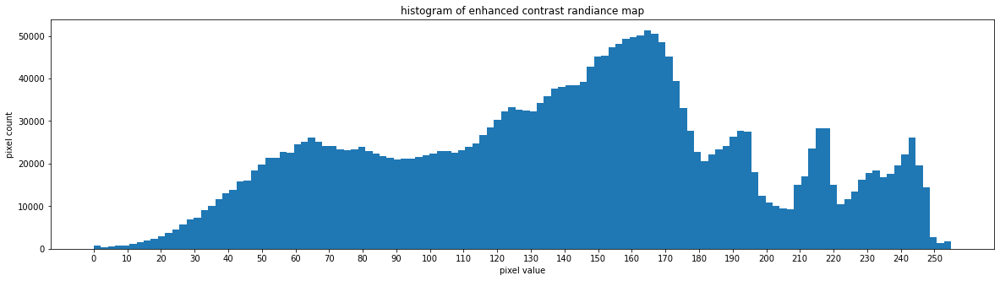

In [30]:
plotHist(rmStretched2, "histogram of enhanced contrast randiance map")

### Enhance the contrast, saturation ect. with PIL library

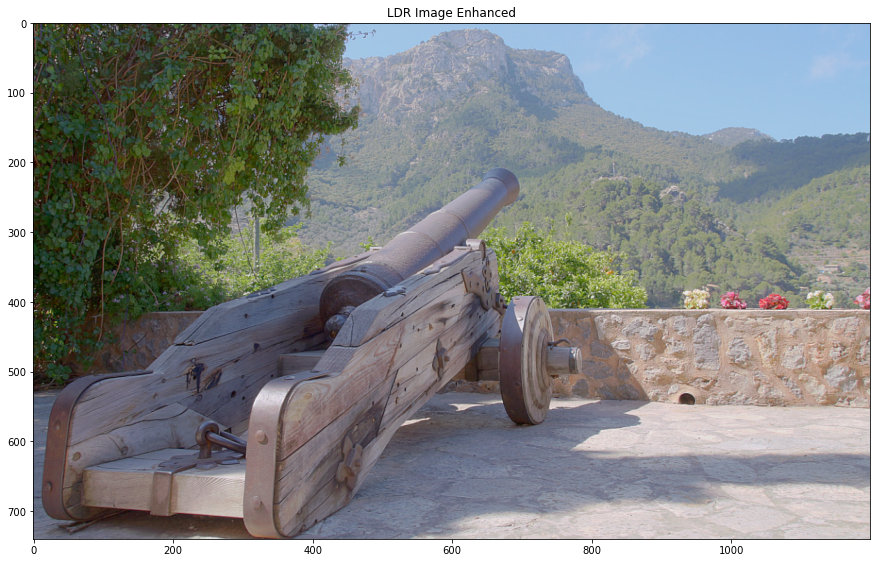

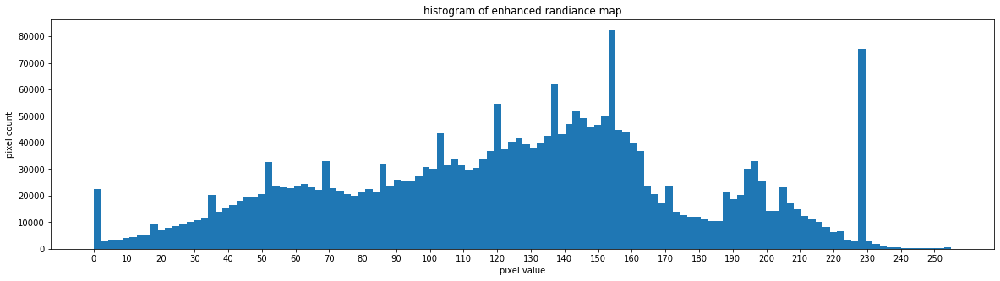

In [31]:
imgEnhanced = Image.fromarray(np.uint8(rmStretched2Img))
saturation = ImageEnhance.Color(imgEnhanced)
imgEnhanced = saturation.enhance(1.7)
contrast = ImageEnhance.Contrast(imgEnhanced)
imgEnhanced = contrast.enhance(1.0)
brightness = ImageEnhance.Brightness(imgEnhanced)
imgEnhanced = brightness.enhance(0.9)
sharpness = ImageEnhance.Sharpness(imgEnhanced)
imgEnhanced = sharpness.enhance(3)

fig = plt.figure(figsize = (15, 15))
plt.title("LDR Image Enhanced")
plt.imshow(imgEnhanced)
plt.show()
plotHist(imgEnhanced, "histogram of enhanced randiance map")

### Comparing the resulting LDR image to the set of original images:
#### - Although it's the most simple and naive approach, the result looks not bad, at least we have achieved our goal of merging the details of the bright area and dark area of images with different exposures into a single image, the leaves on the left and the bright area of sunlight reflection on the ground are both very clear, even the texture of the ground is visible.
#### - The color in the bright area are washed out, more advanced tone mapping techniques can prevent this.

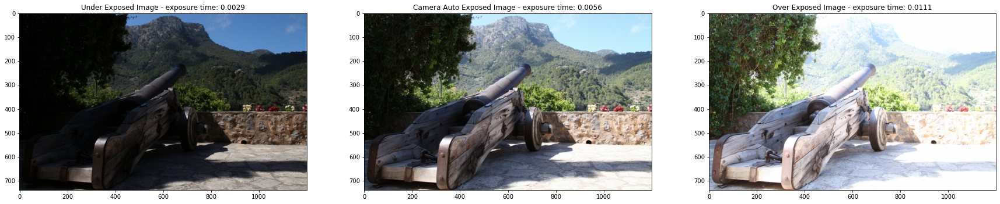

In [32]:
images, times = readImgAndTime("cannon", ".jpeg", False)
showImages(images, times)

### Similar Approach: use gamma correction instead of the linear mapping

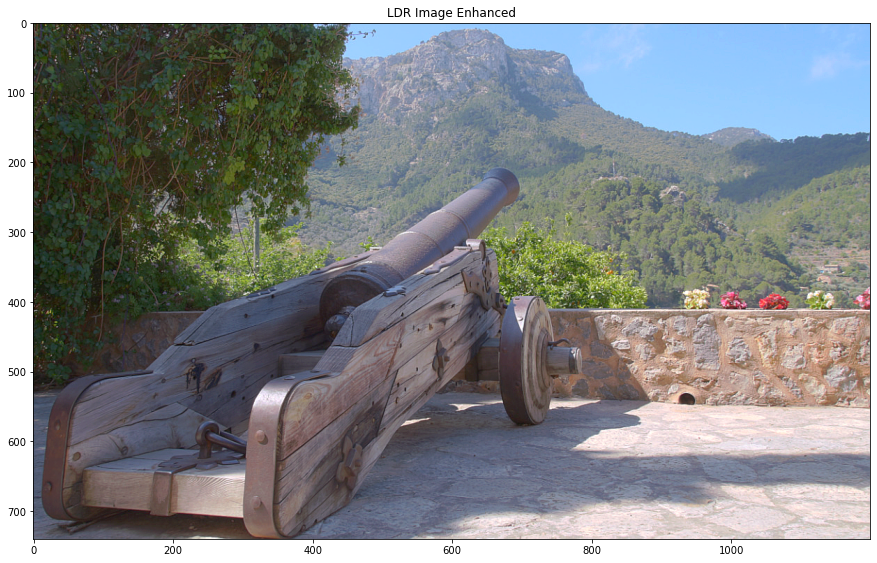

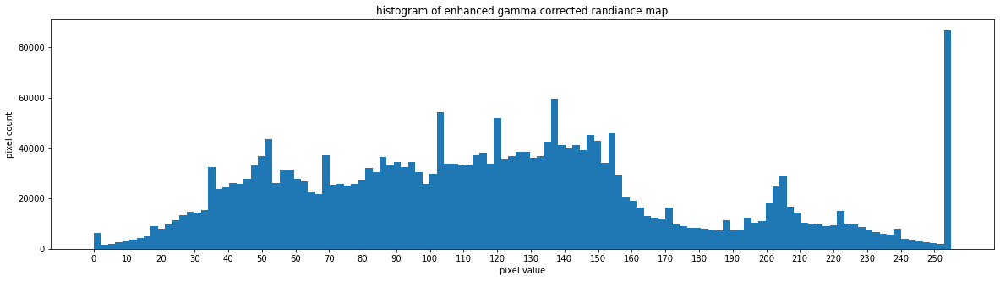

In [33]:
rmNorm = (radianceMap - np.min(radianceMap)) * (1 / (np.max(radianceMap) - np.min(radianceMap)))

gamma = 1/2.8
rmGamma = np.power(rmNorm / float(np.max(rmNorm)), 1.0/gamma) * 255

imgEnhanced = Image.fromarray(np.uint8(rmGamma))
saturation = ImageEnhance.Color(imgEnhanced)
imgEnhanced = saturation.enhance(1.7)
contrast = ImageEnhance.Contrast(imgEnhanced)
imgEnhanced = contrast.enhance(1.2)
brightness = ImageEnhance.Brightness(imgEnhanced)
imgEnhanced = brightness.enhance(1.1)
sharpness = ImageEnhance.Sharpness(imgEnhanced)
imgEnhanced = sharpness.enhance(3)

fig = plt.figure(figsize = (15, 15))
plt.title("LDR Image Enhanced")
plt.imshow(imgEnhanced)
plt.show()
plotHist(imgEnhanced, "histogram of enhanced gamma corrected randiance map")

 ## Other Approaches: advanced tone mapping 
 
 ### I tried two implementations here but both not working very well.

### 1. Gamma correction only apply to intensity channel 

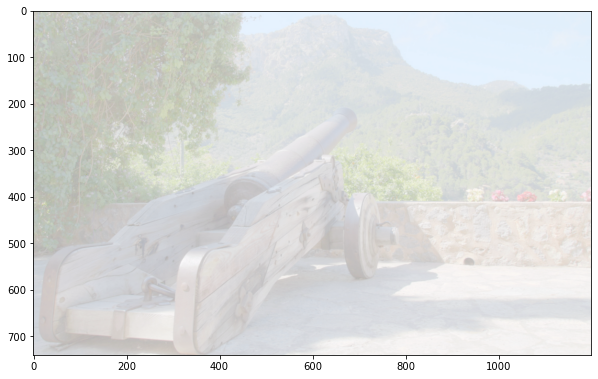

In [34]:
rmNorm = (radianceMap - np.min(radianceMap)) * (1 / (np.max(radianceMap) - np.min(radianceMap)))

rmNormImg = Image.fromarray(np.uint8(rmNorm * 255))
rmNormYCC = rmNormImg.convert("YCbCr")

rmY = rmNormYCC.getchannel('Y')
rmCb = rmNormYCC.getchannel('Cb')
rmCr = rmNormYCC.getchannel('Cr')

gamma = 2
rmGammaY = rmY.point(lambda p: np.power(p / np.max(rmY), 1.0/gamma) * 255)

rmTone = Image.merge('YCbCr', (rmGammaY, rmCb , rmCr))
rmTone = rmTone.convert('RGB')

#print(np.array(rmNormYCC))
#rmGammaCV = cv2.cvtColor(np.array(rmGammaImg), cv2.COLOR_RGB2BGR)

fig = plt.figure(figsize = (10, 10))
plt.imshow(rmTone)
plt.show()
#showCVImage(rmToneCV)
#plotHist(rmGammaY, "histogram of rmY")
#plotHist(rmCb, "histogram of rmCb")
#plotHist(rmCr, "histogram of rmCr")
#plotHist(rmTone, "histogram of rmTone")

## 2. Reinhard tone-mapping [3]

log-average luminance: 0.722047406176774


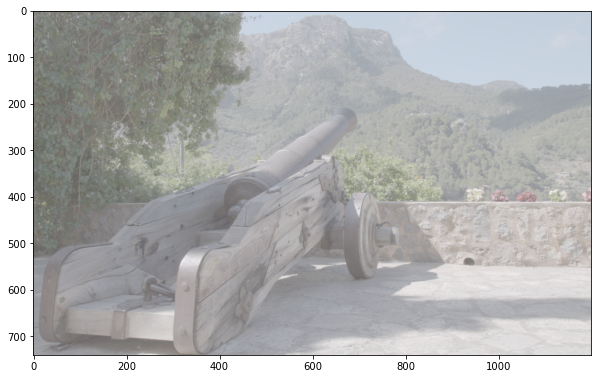

In [35]:
rmLuminance = np.dot(rmNorm[...,:], [0.2126, 0.7152, 0.0722])
Lflatten = np.array(rmLuminance).flatten()
Lavg = np.exp(sum(np.log(Lflatten)) / len(Lflatten))
print("log-average luminance: " + str(Lavg))
a = 0.36
scaledLuminance = a / Lavg * rmLuminance

# tone mapping operator
Ltone = scaledLuminance * (1 + scaledLuminance / np.max(scaledLuminance)**2) / (1 + scaledLuminance)
# scaling operator M
M = Ltone / scaledLuminance

oldR, oldG, oldB = rmNorm[:, :, 0], rmNorm[:, :, 1], rmNorm[:, :, 2]

newR = M * oldR
newG = M * oldG
newB = M * oldB
rmTonemapped = np.dstack((newR, newG, newB))
rmTonemapped = (rmTonemapped - np.min(rmTonemapped)) * (255 / (np.max(rmTonemapped) - np.min(rmTonemapped)))

rmTonemappedImg = Image.fromarray(np.uint8(rmTonemapped))
fig = plt.figure(figsize = (10, 10))
plt.imshow(rmTonemappedImg)
plt.show()

# Part III: now we can try to drop the assumption of known exposure

## Firstly, we test on another image set that whether we need the exact exposure time or just the ratio of exposure time among the images

In [36]:
def Debevec(images, times) :
    """
    Arguments:
    
    images: an array of images of different exposure
    times: an array of exposure times
    
    Returns:

    radianceMap: the radiance map recovered from the given images
    """
    # Recover Camera Response Function (CRF) 
    imagesR = []
    imagesG = []
    imagesB = []
    for i in range(len(images)) :
        r, g, b = images[i].split()
        imagesR += [r]
        imagesG += [g]
        imagesB += [b]
    width, height = images[0].size
    sampleSize = 1000
    sampleIndices = np.arange(sampleSize) * int(width * height / sampleSize)
    print("Recovering CRF...")
    gR, lER = recoverCRF(imagesR, times, sampleIndices, l = 100)
    gG, lEG = recoverCRF(imagesG, times, sampleIndices, l = 100)
    gB, lEB = recoverCRF(imagesB, times, sampleIndices, l = 100)

    # recover radiance map
    radianceMapR = recoverRadianceMap(gR, imagesR, times)
    print("Radiance map for channel R created...")
    radianceMapG = recoverRadianceMap(gG, imagesG, times)
    print("Radiance map for channel G created...")
    radianceMapB = recoverRadianceMap(gB, imagesB, times)
    print("Radiance map for channel B created...")
    print("Done.")

    # recover radiance map
    radianceMap = np.dstack((radianceMapR,radianceMapG,radianceMapB))
    return radianceMap

## Firstly use the real exposure times

#### Set of images comes from easyHDR [1].

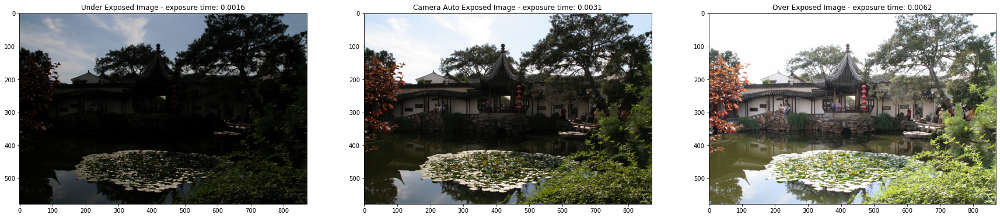

Recovering CRF...
Radiance map for channel R created...
Radiance map for channel G created...
Radiance map for channel B created...
Done.


In [37]:
# read the images and times in the PIL format
images, times = readImgAndTime("chinese-garden", ".jpeg", False)
showImages(images, times)

radianceMap = Debevec(images, times)

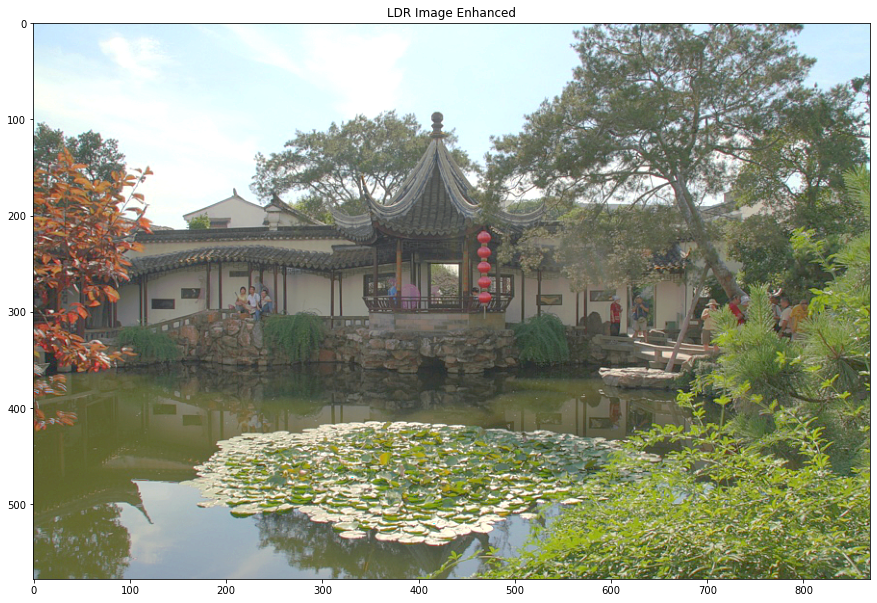

In [38]:
# simple tone mapping
rmNorm = (radianceMap - np.min(radianceMap)) * (1 / (np.max(radianceMap) - np.min(radianceMap)))

gamma = 1/2
rmGamma = np.power(rmNorm / float(np.max(rmNorm)), 1.0/gamma) * 255

imgEnhanced = Image.fromarray(np.uint8(rmGamma))
saturation = ImageEnhance.Color(imgEnhanced)
imgEnhanced = saturation.enhance(1.8)
contrast = ImageEnhance.Contrast(imgEnhanced)
imgEnhanced = contrast.enhance(1.4)
brightness = ImageEnhance.Brightness(imgEnhanced)
imgEnhanced = brightness.enhance(1.1)
sharpness = ImageEnhance.Sharpness(imgEnhanced)
imgEnhanced = sharpness.enhance(2)

fig = plt.figure(figsize = (15, 15))
plt.title("LDR Image Enhanced")
plt.imshow(imgEnhanced)
plt.show()

## Use fake exposure time that only preserve the ratio of the real exposure time

real exposure time of images: [0.0015625 0.003125  0.00625  ]
fake exposure time of images: [0.00390625 0.0078125  0.015625  ]
Recovering CRF...
Radiance map for channel R created...
Radiance map for channel G created...
Radiance map for channel B created...
Done.


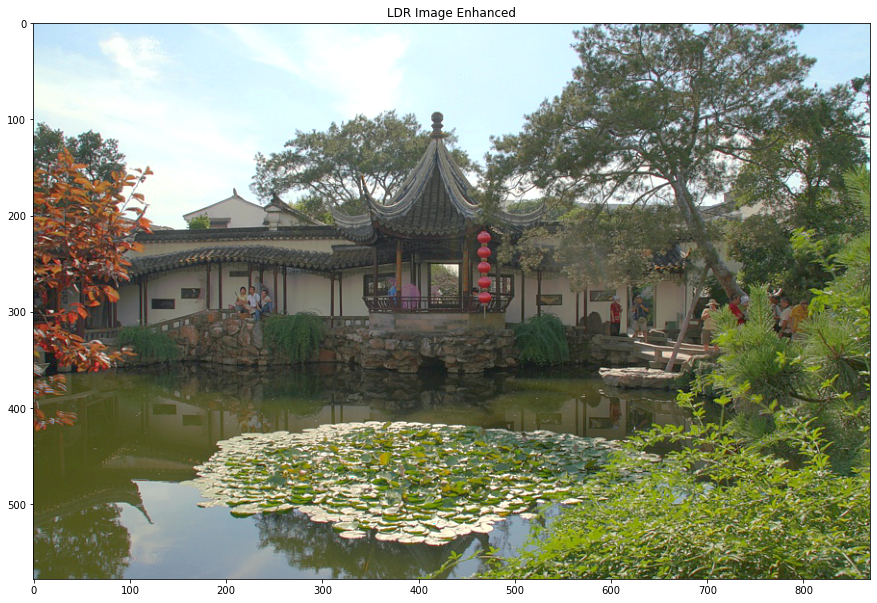

In [39]:

print("real exposure time of images: " + str(times))

# use fake exposure time that only preserve the ratio of the real exposure time
fakeTimes = times * 2.5

print("fake exposure time of images: " + str(fakeTimes))

radianceMap = Debevec(images, fakeTimes)
# simple tone mapping
rmNorm = (radianceMap - np.min(radianceMap)) * (1 / (np.max(radianceMap) - np.min(radianceMap)))

gamma = 1/2
rmGamma = np.power(rmNorm / float(np.max(rmNorm)), 1.0/gamma) * 255

imgEnhanced = Image.fromarray(np.uint8(rmGamma))
saturation = ImageEnhance.Color(imgEnhanced)
imgEnhanced = saturation.enhance(1.8)
contrast = ImageEnhance.Contrast(imgEnhanced)
imgEnhanced = contrast.enhance(1.4)
brightness = ImageEnhance.Brightness(imgEnhanced)
imgEnhanced = brightness.enhance(1.1)
sharpness = ImageEnhance.Sharpness(imgEnhanced)
imgEnhanced = sharpness.enhance(2)

fig = plt.figure(figsize = (15, 15))
plt.title("LDR Image Enhanced")
plt.imshow(imgEnhanced)
plt.show()

## We get the correct result with fake exposure time, hence let's try to estimate the exposure time ratio by the mean intensity.

In [40]:
print("real exposure time of images: " + str(times))

estimateTimes = []
for i in range(len(images)) :
    estimateTimes += [np.mean(images[i])]

print("estimated exposure time of images: " + str(estimateTimes))

print("check the ratio: " + str(estimateTimes / times))

real exposure time of images: [0.0015625 0.003125  0.00625  ]
estimated exposure time of images: [39.422403849978124, 83.0225476938578, 137.52786328865557]
check the ratio: [25230.33808802 26567.21486615 22004.45779829]


In [41]:
radianceMap = Debevec(images, estimateTimes)

Recovering CRF...
Radiance map for channel R created...
Radiance map for channel G created...
Radiance map for channel B created...
Done.


### We can still get the decent result with gamma and other image properties adjusted.

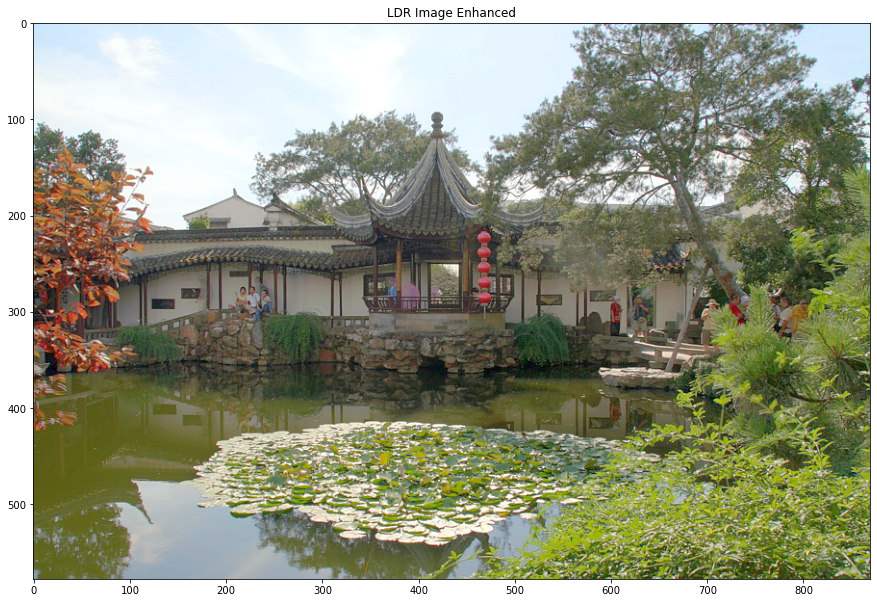

In [42]:
# simple tone mapping
rmNorm = (radianceMap - np.min(radianceMap)) * (1 / (np.max(radianceMap) - np.min(radianceMap)))

gamma = 1.5
rmGamma = np.power(rmNorm / float(np.max(rmNorm)), 1.0/gamma) * 255

imgEnhanced = Image.fromarray(np.uint8(rmGamma))
saturation = ImageEnhance.Color(imgEnhanced)
imgEnhanced = saturation.enhance(1.8)
contrast = ImageEnhance.Contrast(imgEnhanced)
imgEnhanced = contrast.enhance(1.8)
brightness = ImageEnhance.Brightness(imgEnhanced)
imgEnhanced = brightness.enhance(1.3)
sharpness = ImageEnhance.Sharpness(imgEnhanced)
imgEnhanced = sharpness.enhance(2)

fig = plt.figure(figsize = (15, 15))
plt.title("LDR Image Enhanced")
plt.imshow(imgEnhanced)
plt.show()

# Conclusion

### In this project about High-dynamic range imaging, we successfully implemented the Debevec-Malik method. 
### With the input of several photos taken with tripod at the same angle that have different exposure, we:
#### 1. recovered the CRF of RGB channels
#### 2. used the CRF to recover the radiance map
#### 3. discussed some techniques of tone mapping
#### 4. get the LDR result image compressed from radiance map that reserves both the details in the brightest and darkest parts.
#### 5. successfully estimated the exposure time from the mean intensity of image.

### Due to the limitations of time and group size(only myself), some parts are not sufficiently discussed. If this project is continued, the following parts will be developed:
#### 1. make the algorithm support image sequences taken without tripod. The main idea is adding one step of aligning the images just after the images are read, like the "Aline with MTB" step in the cv2 demostration. The implementation will be very similar to the "Panorama Mosaicing" in assignment 1, just extend that method to multiple images.
#### 2. try the Local tone mapping using bilateral filter and Gradient domain tone mapping mentioned in Szeliski's Draft

<br>

# References


[1] Okonek, B. (n.d.). Sample HDR photos processed WITH Easyhdr. HDR Photography. Retrieved April 20, 2021, from https://www.easyhdr.com/examples/
    
[2] Debevec, P. E., &amp; Malik, J. (2008). Recovering high dynamic range radiance maps from photographs. ACM SIGGRAPH 2008 Classes on - SIGGRAPH '08. doi:10.1145/1401132.1401174

[3] Erik Reinhard, Michael Stark, Peter Shirley, Jim Ferwerda, Photographics Tone Reproduction for Digital Images, SIGGRAPH 2002.